# Self-Driving Car Engineer Nanodegree

## Project: Advanced Lane Finding

***

Note: Throughout this project, I will be following a convention to keep the code clear.

Functions starting with a `_` are not meant to be re-used, but are used as procedures to limit the scope of created variables. 

Functions not starting with a `_` are meant to be reusable.

Global variables will all be capitalized.

## Import Packages

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import os

## General Helper Methods for Getting and Displaying Images

In [2]:
def get_images(image_folder_path, get_file_names=False):
    '''Gets a list of images from the given directory'''
    images = []
    file_names = os.listdir(image_folder_path)
    file_names.sort()
    for file_name in file_names:
        if file_name.split('.')[-1] == 'jpg':
            images.append(mpimg.imread('{}/{}'.format(image_folder_path, file_name)))
                              
    if get_file_names:
        return images, file_names

    return images

def display_images(images, names, cmap=None):
    '''Display images in subplot format'''
    assert(len(images) == len(names))

    fig, axs = plt.subplots(int((len(images)+1)/2), 2, figsize=(10, len(images) * 1.5))
    fig.tight_layout()

    for i in range(len(images)):
        image = images[i]
        image_name = names[i]
        axs[int(i/2)][i%2].imshow(image, cmap=cmap) 
        axs[int(i/2)][i%2].set_title('{}'.format(image_name))

## General Helper Methods for Transforming Images

In [3]:
def rgb_to_grayscale(rgb_image):
    '''Return grayscale version of image. Assumes RGB image (from mpimg read, not cv2)'''
    return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

def rgb_to_r(rgb_image):
    '''Return red channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 0]

def rgb_to_g(rgb_image):
    '''Return green channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 1]

def rgb_to_b(rgb_image):
    '''Return blue channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 2]

def rgb_to_h(rgb_image):
    '''Return hue channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 0]

def rgb_to_l(rgb_image):
    '''Return luminance channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 1]

def rgb_to_s(rgb_image):
    '''Return saturation channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 2]

## Camera Calibration

### Helper Methods

In [4]:
def find_chessboard_corners(gray, n_inside_corners_x, n_inside_corners_y):
    '''Returns corners of gray image'''
    ret, corners = cv2.findChessboardCorners(gray, (n_inside_corners_x, n_inside_corners_y))
    if not ret:
        print("WARNING: Could not find corners")
    return corners

def get_corners_image(image, corners, n_inside_corners_x, n_inside_corners_y):
    '''Draw corners on image'''
    copied_image = image.copy()
    return cv2.drawChessboardCorners(copied_image, (n_inside_corners_x, n_inside_corners_y), corners, True)

def get_obj_points(n_inside_corners_x, n_inside_corners_y):
    '''Get the object points of this image'''
    obj_points = np.zeros((n_inside_corners_x*n_inside_corners_y, 3), np.float32)
    obj_points[:,:2] = np.mgrid[0:n_inside_corners_x,0:n_inside_corners_y].T.reshape(-1,2)
    return obj_points

def get_camera_matrix_and_distortion_matrix(image, object_points, image_points):
    '''Get the camera and distoration matrices based on object points and image points'''
    gray = rgb_to_grayscale(image)
    _, mtx, dist, _, _ = cv2.calibrateCamera(object_points, image_points, gray.shape[::-1], None, None)
    return mtx, dist

def undistort(image, mtx, dist):
    '''Undistort image based on camera and distortion matrices'''
    return cv2.undistort(image, mtx, dist)

### Main Code

In [5]:
# Constants across chessboards
N_INSIDE_CORNERS_X = 9
N_INSIDE_CORNERS_Y = 6
CALIBRATION_IMAGES, CALIBRATION_IMAGE_FILE_NAMES = get_images('./camera_cal', get_file_names=True)

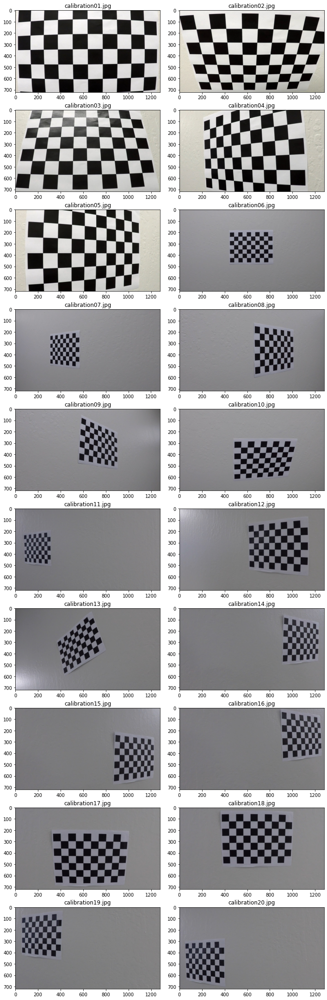

In [6]:
# Read in calibration images and display them
def _display_calibration_images():
    display_images(CALIBRATION_IMAGES, CALIBRATION_IMAGE_FILE_NAMES)
    
_display_calibration_images()

In [7]:
def _find_obj_points_and_img_points():
    # Find corners in chessboard images
    print("Finding corners in calibration images. Assuming N_INSIDE_CORNERS_X = {}. N_INSIDE_CORNERS_Y = {}".format(N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y))
    print()

    all_obj_points = []
    all_img_points = []

    num_valid_images = 0
    invalid_image_indices = []
    for i, calibration_image in enumerate(CALIBRATION_IMAGES):
        # Find corners
        obj_points = get_obj_points(N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y)
        corners = find_chessboard_corners(rgb_to_grayscale(calibration_image), N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y)

        # Skip images in which corners could not be found    
        if corners is None or obj_points.shape[0] != corners.shape[0]:
            print("Invalid image found at index {}. Skipping.".format(i))
            invalid_image_indices.append(i)
            continue
        
        # Store points
        num_valid_images += 1
        all_obj_points.append(obj_points)
        all_img_points.append(corners)

    # Output message
    print()
    print("Corners successfully found in {}/{} images.".format(num_valid_images, len(CALIBRATION_IMAGES)))
    
    return all_obj_points, all_img_points, invalid_image_indices

ALL_OBJ_POINTS, ALL_IMG_POINTS, INVALID_IMG_INDICES = _find_obj_points_and_img_points()

Finding corners in calibration images. Assuming N_INSIDE_CORNERS_X = 9. N_INSIDE_CORNERS_Y = 6

Invalid image found at index 0. Skipping.
Invalid image found at index 3. Skipping.
Invalid image found at index 4. Skipping.

Corners successfully found in 17/20 images.


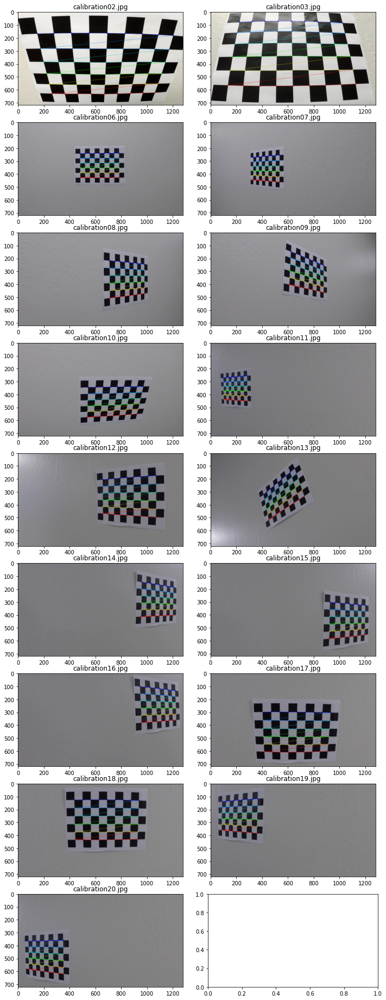

In [8]:
# Display chessboard images with corners
def _get_corner_images(invalid_image_indices, corners_list):
    # Helper method used later
    import copy
    calibration_images, calibration_image_file_names = copy.deepcopy(CALIBRATION_IMAGES), copy.copy(CALIBRATION_IMAGE_FILE_NAMES)
    
    # Remove invalid
    for invalid_image_index in reversed(invalid_image_indices):
        calibration_image_file_names.pop(invalid_image_index)
        calibration_images.pop(invalid_image_index)

    # Add corners to images
    corner_images = []
    for i in range(len(corners_list)):
        corners = corners_list[i]
        img = calibration_images[i]
        corner_images.append(get_corners_image(img, corners, N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y))
    
    return corner_images, calibration_image_file_names

def _display_corner_images(invalid_image_indices, corners_list):
    corner_images, corner_names = _get_corner_images(invalid_image_indices, corners_list)
    
    # Display images
    display_images(corner_images, corner_names)
    
_display_corner_images(INVALID_IMG_INDICES, ALL_IMG_POINTS)

In [9]:
# Calculate camera matrix and distortion matrix
CAMERA_MATRIX, DISTORTION_MATRIX = get_camera_matrix_and_distortion_matrix(CALIBRATION_IMAGES[0], ALL_OBJ_POINTS, ALL_IMG_POINTS)
print("CAMERA_MATRIX = \n{}".format(CAMERA_MATRIX))
print()
print("DISTORTION_MATRIX = \n{}".format(DISTORTION_MATRIX))

CAMERA_MATRIX = 
[[1.15777829e+03 0.00000000e+00 6.67113868e+02]
 [0.00000000e+00 1.15282230e+03 3.86124656e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

DISTORTION_MATRIX = 
[[-0.24688571 -0.02372833 -0.00109832  0.00035104 -0.00260415]]


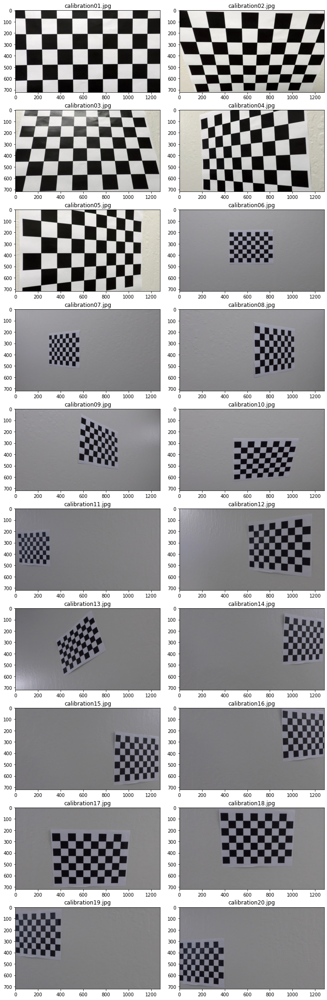

In [10]:
# Display undistorted chessboard images
def _display_undistorted_images(camera_matrix, distortion_matrix):
    import copy
    calibration_images, calibration_image_file_names = copy.deepcopy(CALIBRATION_IMAGES), copy.copy(CALIBRATION_IMAGE_FILE_NAMES)

    undistorted_calibration_images = [undistort(img, camera_matrix, distortion_matrix) for img in calibration_images]
    display_images(undistorted_calibration_images, calibration_image_file_names)
    
_display_undistorted_images(CAMERA_MATRIX, DISTORTION_MATRIX)

## Perspective Transform

In [11]:
def _helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border):
    width, height = image_shape
    src = np.float32([corners[0],
                      corners[1],
                      corners[2],
                      corners[3]])
    
    dest = np.float32([[left_border*width, top_border*height],
                       [(1-right_border)*width, top_border*height],
                       [left_border*width, (1-bottom_border)*height],
                       [(1-right_border)*width, (1-bottom_border)*height]])
    
    return src, dest
    
def perspective_transform(image, corners, top_border=1/6, bottom_border=1/6, left_border=1/6, right_border=1/6, return_M=False):
    '''Warps image using the four corners.
    
    corners is a list of pairs which represent the corners [ul, ur, ll, lr]
    ul = upper left
    ur = upper right
    ll = lower left
    lr = lower right
    '''
    height, width = image.shape[0], image.shape[1]
    image_shape = (width, height)

    src, dest = _helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border)

    M = cv2.getPerspectiveTransform(src, dest)
    perspective_image = cv2.warpPerspective(image, M, image_shape, flags=cv2.INTER_LINEAR)
    
    if return_M:
        return perspective_image, M
    return perspective_image

def inverse_perspective_transform(image, corners, top_border=1/6, bottom_border=1/6, left_border=1/6, right_border=1/6, return_M=False):
    '''Inverse warps image using the four corners
    
    corners is a list of pairs which represent the corners [ul, ur, ll, lr]
    ul = upper left
    ur = upper right
    ll = lower left
    lr = lower right
    '''
    height, width = image.shape[0], image.shape[1]
    image_shape = (width, height)

    src, dest = _helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border)

    M = cv2.getPerspectiveTransform(dest, src)
    perspective_image = cv2.warpPerspective(image, M, image_shape, flags=cv2.INTER_LINEAR)
    
    if return_M:
        return perspective_image, M
    return perspective_image

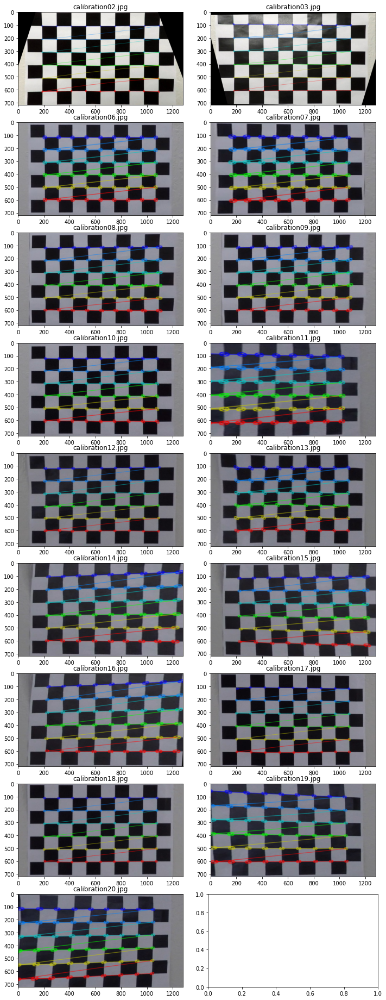

In [12]:
# Display chessboard images birds-eye view
def _display_perspective_images(invalid_image_indices, corners_list):
    perspective_images, perspective_names = _get_corner_images(invalid_image_indices, corners_list)

    four_corners_list = [[corners[0],
                          corners[N_INSIDE_CORNERS_X-1],
                          corners[N_INSIDE_CORNERS_X*(N_INSIDE_CORNERS_Y-1)],
                          corners[N_INSIDE_CORNERS_X*N_INSIDE_CORNERS_Y-1]]
                         for corners in ALL_IMG_POINTS]
    perspective_images = [undistort(img, CAMERA_MATRIX, DISTORTION_MATRIX) for img in perspective_images]
    perspective_images = [perspective_transform(perspective_images[i], four_corners_list[i]) for i in range(len(perspective_images))]
    display_images(perspective_images, perspective_names)

_display_perspective_images(INVALID_IMG_INDICES, ALL_IMG_POINTS)

## Read in Lane Line Images

In [13]:
# Read in lane line images
LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES = get_images('./test_images', get_file_names=True)

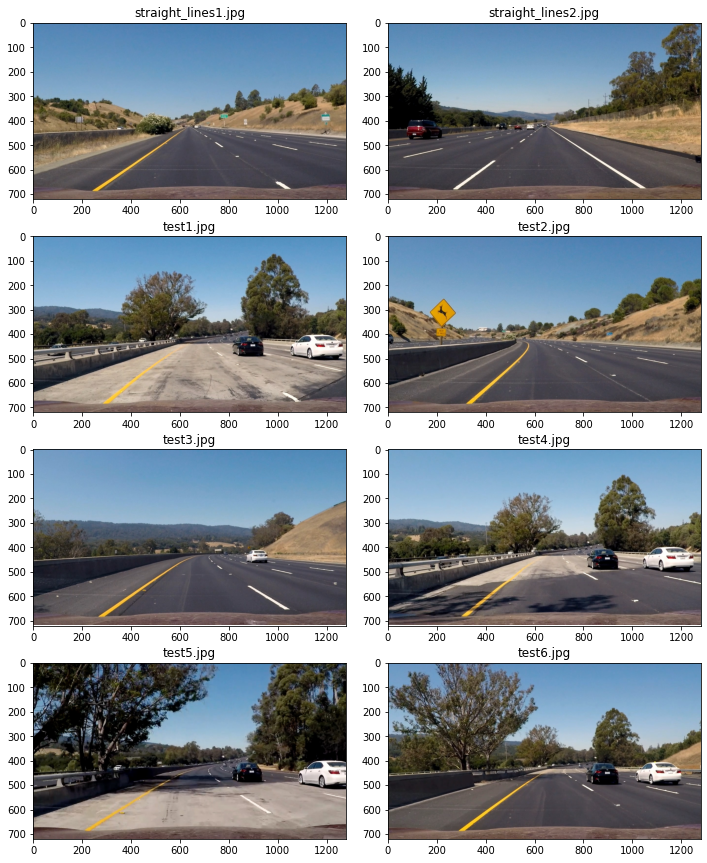

In [14]:
# Display lane line images
display_images(LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES)

## Thresholded Binary Image

### Helper Methods

In [15]:
def channel_thresh(single_channel_image, thresh=(0, 255)):
    # Create binary output, where pixels are set to 1 when the value is within the threshold
    thresh_min, thresh_max = thresh
    binary_output = np.zeros_like(single_channel_image)
    binary_output[(single_channel_image > thresh_min) & (single_channel_image < thresh_max)] = 1
    return binary_output
    
def abs_sobel_thresh(single_channel_image, orient=[1,0], thresh=(0, 255)):
    '''x is [1, 0]. y is [0, 1]'''
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take derivative in given orientation
    sobel = cv2.Sobel(single_channel_image, cv2.CV_64F, orient[0], orient[1])
    
    # 3) Take absolute value of gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8 bit integer
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create mask of 1's where the magnitude is within thresholds
    thresh_min, thresh_max = thresh
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh_min) & (scaled_sobel < thresh_max)] = 1
    
    return binary_output

def sobel_mag_thresh(single_channel_image, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take gradients in x and y
    sobelx = cv2.Sobel(single_channel_image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(single_channel_image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    sobelxy = (sobelx**2 + sobely**2)**0.5
    
    # 4) Scale to 8 bit int
    scaled_sobelxy = np.uint8(255 * sobelxy / np.max(sobelxy))
    
    # 5) Create binary mask where mag thresholds are met
    thresh_min, thresh_max = mag_thresh
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy > thresh_min) & (scaled_sobelxy < thresh_max)] = 1
    
    return binary_output

def sobel_dir_thresh(single_channel_image, sobel_kernel=3, thresh_degrees=(0, 90)):
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take gradient in x and y
    sobelx = cv2.Sobel(single_channel_image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(single_channel_image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take absoluate value of gradient
    sobelxy = (sobelx**2 + sobely**2)**0.5
    
    # 4) Calculate direction
    direction_degrees = np.rad2deg(np.arctan2(np.abs(sobely), np.abs(sobelx)))

    # 5) Create binary mask when thresholds are met
    thresh_min, thresh_max = thresh_degrees
    binary_output = np.zeros_like(sobelxy)
    binary_output[(direction_degrees > thresh_min) & (direction_degrees < thresh_max)] = 1
    
    return binary_output

### Visualize Single-Channel Images

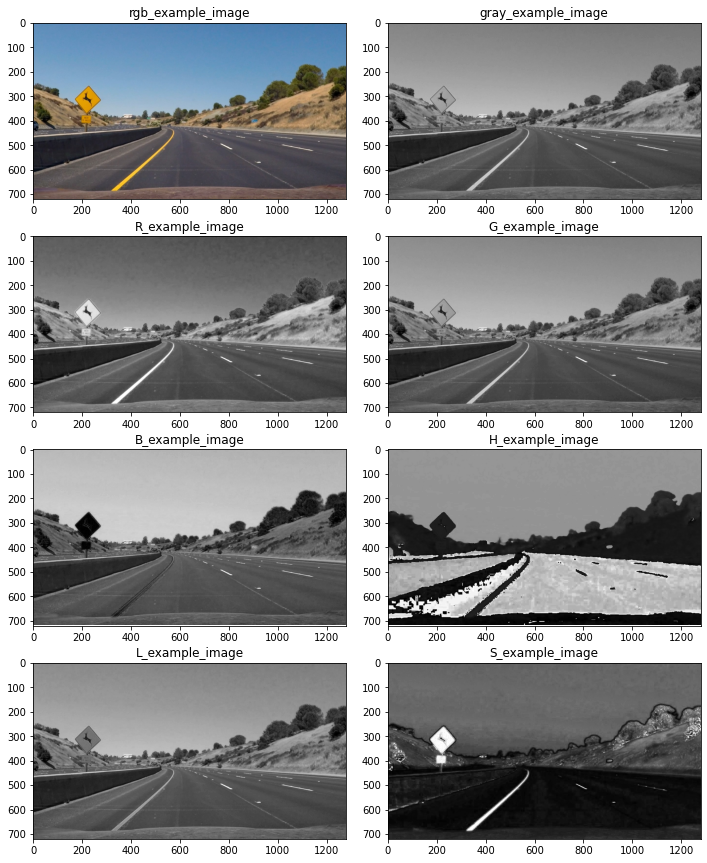

In [16]:
# Start from example image and visualize different single-channel transforms for future binary transforms
def _visualize_single_channel_images():
    rgb_example_image = LANE_LINE_IMAGES[3]

    # Gray
    gray_example_image = rgb_to_grayscale(rgb_example_image)

    # RGB
    R_example_image, G_example_image, B_example_image = rgb_to_r(rgb_example_image), rgb_to_g(rgb_example_image), rgb_to_b(rgb_example_image)

    # HSV
    H_example_image, L_example_image, S_example_image = rgb_to_h(rgb_example_image), rgb_to_l(rgb_example_image), rgb_to_s(rgb_example_image)

    display_images([rgb_example_image, gray_example_image, R_example_image, G_example_image, B_example_image, H_example_image, L_example_image, S_example_image],
                   ['rgb_example_image', 'gray_example_image', 'R_example_image', 'G_example_image', 'B_example_image', 'H_example_image', 'L_example_image', 'S_example_image'],
                   cmap='gray')
_visualize_single_channel_images()

### Define and Visualize Custom Weighted Single Channel Transform

In [17]:
def rgb_to_custom_weighted_single_channel(rgb_image):
    R_image = rgb_to_r(rgb_image)
    S_image = rgb_to_s(rgb_image)
    return cv2.addWeighted(R_image, 0.25, S_image, 0.75, 0.0)

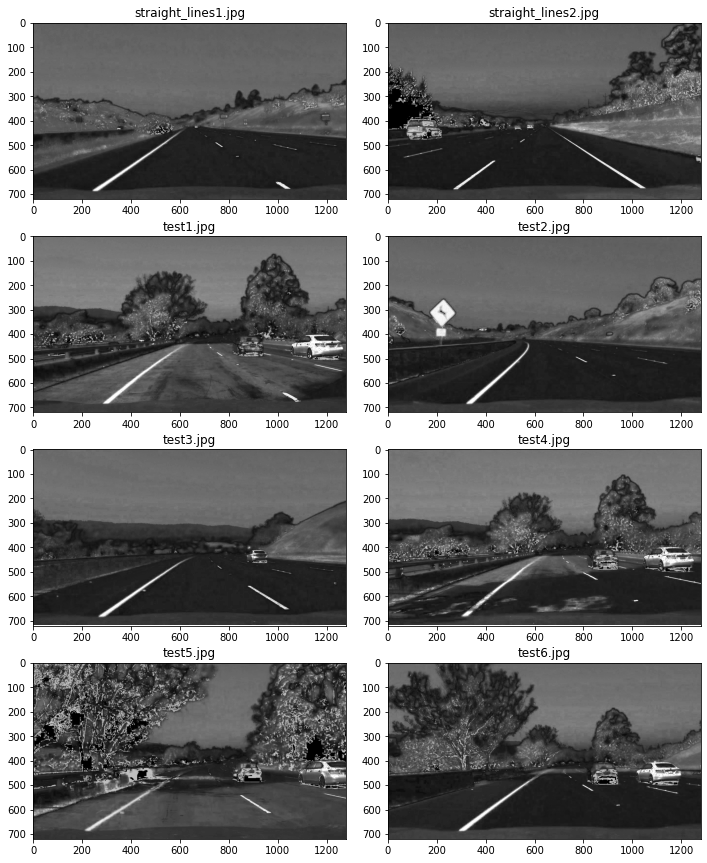

In [18]:
def _visualize_custom_weighted_single_channel():
    single_channel_images = [rgb_to_custom_weighted_single_channel(img) for img in LANE_LINE_IMAGES]
    display_images(single_channel_images, LANE_LINE_IMAGE_FILE_NAMES, cmap='gray')

_visualize_custom_weighted_single_channel()

### Create binary images

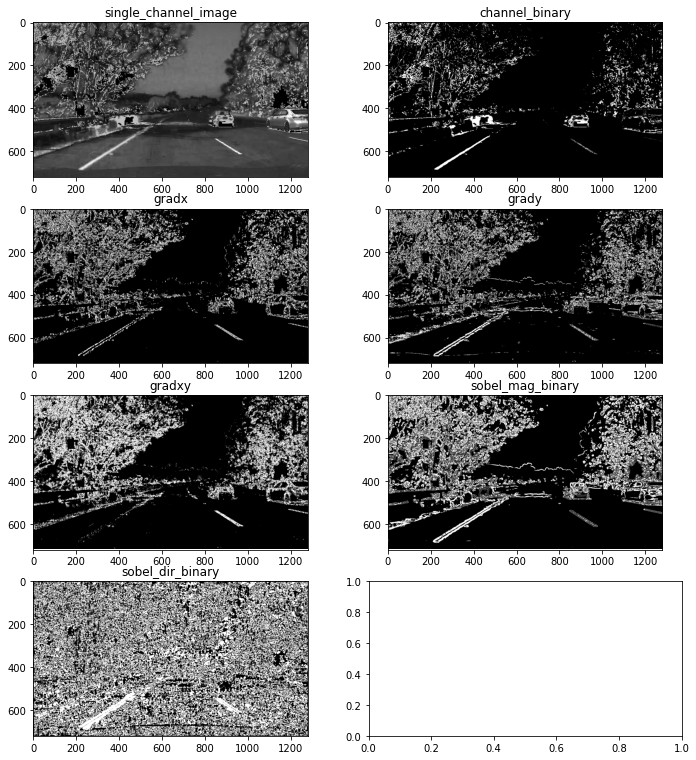

In [76]:
def get_all_thresholdings(single_channel_image):
    channel_binary = channel_thresh(single_channel_image, thresh=[170, 255])
    gradx = abs_sobel_thresh(single_channel_image, orient=[1, 0], thresh=[20, 100])
    grady = abs_sobel_thresh(single_channel_image, orient=[0, 1], thresh=[20, 100])
    gradxy = abs_sobel_thresh(single_channel_image, orient=[1, 1], thresh=[10, 255])
    sobel_mag_binary = sobel_mag_thresh(single_channel_image, sobel_kernel=9, mag_thresh=[30, 100])
    sobel_dir_binary = sobel_dir_thresh(single_channel_image, sobel_kernel=15, thresh_degrees=[30, 80])
    return channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary

def _visualize_different_thresholding(rgb_image):
    # Make calculations
    single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(single_channel_image)

    # Display binary images
    display_images([single_channel_image, channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary], 
                   ['single_channel_image', 'channel_binary', 'gradx', 'grady', 'gradxy', 'sobel_mag_binary', 'sobel_dir_binary'], cmap='gray')
    
_visualize_different_thresholding(LANE_LINE_IMAGES[6])

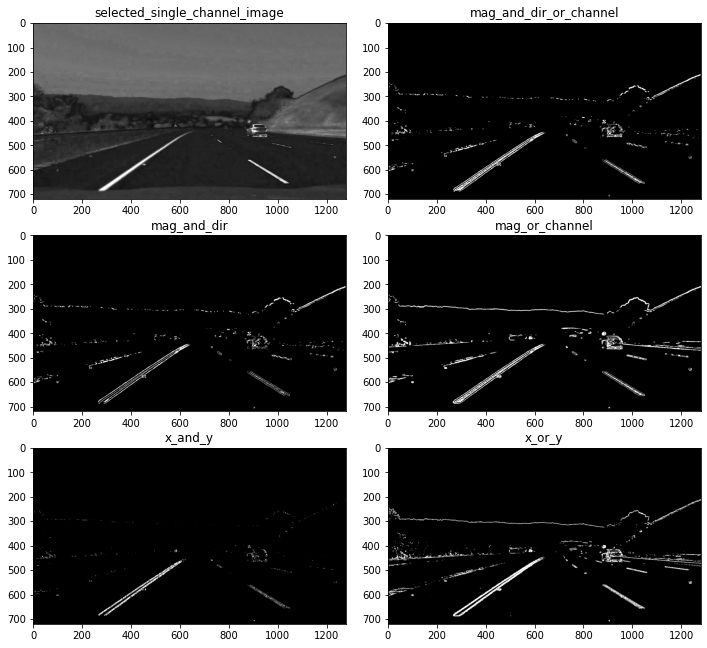

In [74]:
def _visualize_different_combined_thresholding(rgb_image):
    # Make calculations
    selected_single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(selected_single_channel_image)

    # Combine
    mag_and_dir_or_channel = np.zeros_like(sobel_dir_binary)
    mag_and_dir_or_channel[(sobel_mag_binary == 1) & (sobel_dir_binary == 1) | (channel_binary == 1)] = 1
    
    mag_and_dir = np.zeros_like(sobel_dir_binary)
    mag_and_dir[(sobel_mag_binary == 1) & (sobel_dir_binary == 1)] = 1
    
    mag_or_channel = np.zeros_like(sobel_dir_binary)
    mag_or_channel[(sobel_mag_binary == 1) | (channel_binary == 1)] = 1

    x_and_y = np.zeros_like(sobel_dir_binary)
    x_and_y[(gradx == 1) & (grady == 1)] = 1

    x_or_y = np.zeros_like(sobel_dir_binary)
    x_or_y[(gradx == 1) | (grady == 1)] = 1
    
    # Display binary images
    display_images([selected_single_channel_image, mag_and_dir_or_channel, mag_and_dir, mag_or_channel, x_and_y, x_or_y], 
                   ['selected_single_channel_image', 'mag_and_dir_or_channel', 'mag_and_dir', 'mag_or_channel', 'x_and_y', 'x_or_y'], cmap='gray')
    
_visualize_different_combined_thresholding(LANE_LINE_IMAGES[4])

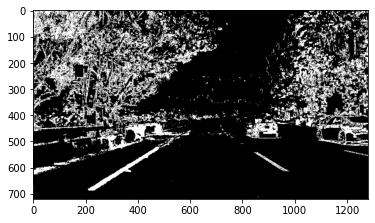

In [52]:
def single_channel_to_custom_binary(single_channel_image):
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(single_channel_image)
    
    # Custom
    combined = np.zeros_like(single_channel_image)
    combined[(channel_binary == 1) | (gradx == 1)] = 1
    return combined

def rgb_to_custom_binary(rgb_image):
    single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    return single_channel_to_custom_binary(single_channel_image)

plt.imshow(rgb_to_custom_binary(LANE_LINE_IMAGES[6]), cmap='gray')

## Road Perspective Transform

### Select Corners for Road Perspective Transform

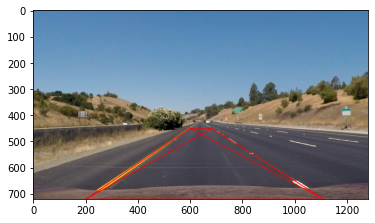

In [53]:
def _create_road_corners(image):
    lower_corner_y = 720
    higher_corner_y = 450
    lane_line_corners = [(599, higher_corner_y),  # Upper left
                         (682, higher_corner_y),  # Upper right 
                         (202, lower_corner_y),   # Lower left
                         (1110, lower_corner_y)]  # Lower right
                         
    return lane_line_corners

def _draw_lane_line_corners(image, corners, radius=1, color=(255, 0, 0), thickness=2, draw_lines=False):
    annotated_image = image.copy()
    
    # Draw circles
    for corner in corners:
        annotated_image = cv2.circle(annotated_image, corner, radius, color, thickness)
        
    # Draw lines between circles
    if draw_lines:
        for i, corneri in enumerate(corners):
            for j, cornerj in enumerate(corners):
                annotated_image = cv2.line(annotated_image, corneri, cornerj, color, thickness)

    return annotated_image

LANE_LINE_CORNERS = _create_road_corners(LANE_LINE_IMAGES[0])
plt.imshow(_draw_lane_line_corners(LANE_LINE_IMAGES[0], LANE_LINE_CORNERS, draw_lines=True))

In [54]:
def undistort_and_perspective(image):
    undistorted = undistort(image, CAMERA_MATRIX, DISTORTION_MATRIX)
    return perspective_transform(undistorted, LANE_LINE_CORNERS, bottom_border=0, left_border=1/4, right_border=1/4, top_border=0)

### Visualize perspective transform

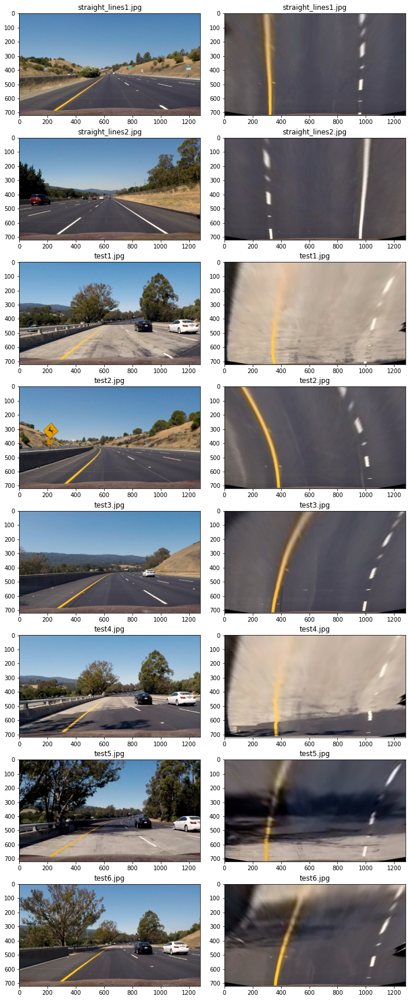

In [55]:
def _display_perspective_transform():
    fixed_images = [undistort_and_perspective(img) for img in LANE_LINE_IMAGES]
    imgs = []
    names = []
    for i in range(len(fixed_images)):
        imgs.append(LANE_LINE_IMAGES[i])
        imgs.append(fixed_images[i])
        names.append(LANE_LINE_IMAGE_FILE_NAMES[i])
        names.append(LANE_LINE_IMAGE_FILE_NAMES[i])

    display_images(imgs, names)

_display_perspective_transform()

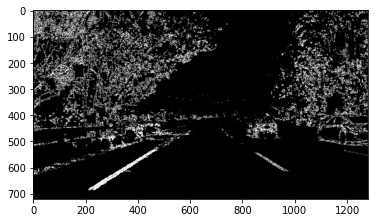

In [99]:
def get_all_thresholdings(single_channel_image):
    channel_binary = channel_thresh(single_channel_image, thresh=[150, 255])
    gradx = abs_sobel_thresh(single_channel_image, orient=[1, 0], thresh=[20, 100])
    grady = abs_sobel_thresh(single_channel_image, orient=[0, 1], thresh=[20, 100])
    gradxy = abs_sobel_thresh(single_channel_image, orient=[1, 1], thresh=[10, 255])
    sobel_mag_binary = sobel_mag_thresh(single_channel_image, sobel_kernel=9, mag_thresh=[30, 100])
    sobel_dir_binary = sobel_dir_thresh(single_channel_image, sobel_kernel=15, thresh_degrees=[30, 80])
    return channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary

def single_channel_to_custom_binary(single_channel_image):
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(single_channel_image)
    
    # Custom
    combined = np.zeros_like(single_channel_image)
    combined[(sobel_dir_binary == 1) & (channel_binary == 1) | ((gradx == 1) & (grady == 1))] = 1
    return combined

def rgb_to_custom_binary(rgb_image):
    single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    return single_channel_to_custom_binary(single_channel_image)

plt.imshow(rgb_to_custom_binary(LANE_LINE_IMAGES[6]), cmap='gray')

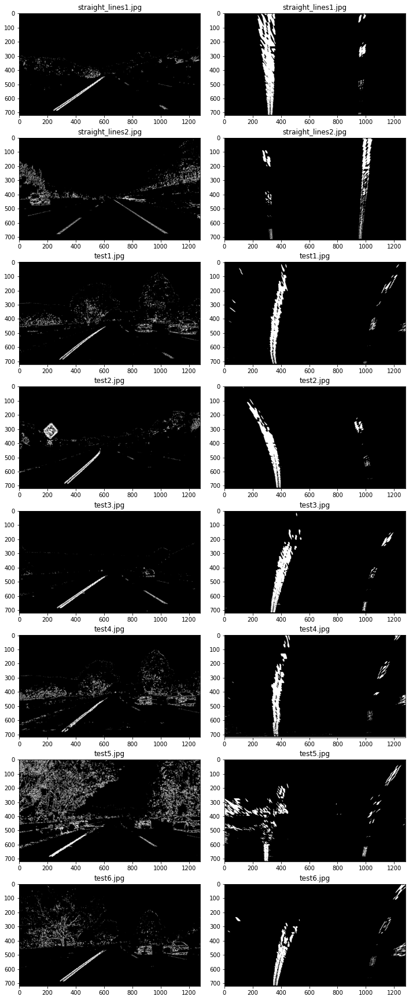

In [100]:
def _display_perspective_transform_binary():
    binary_images = [rgb_to_custom_binary(img) for img in LANE_LINE_IMAGES]
    fixed_images = [undistort_and_perspective(img) for img in binary_images]
    imgs = []
    names = []
    for i in range(len(fixed_images)):
        imgs.append(binary_images[i])
        imgs.append(fixed_images[i])
        names.append(LANE_LINE_IMAGE_FILE_NAMES[i])
        names.append(LANE_LINE_IMAGE_FILE_NAMES[i])

    display_images(imgs, names, cmap='gray')

_display_perspective_transform_binary()

In [57]:
def process_image(rgb_image):
    binary_image = rgb_to_custom_binary(rgb_image)
    return undistort_and_perspective(binary_image)

## Identify Line with Sliding Windows

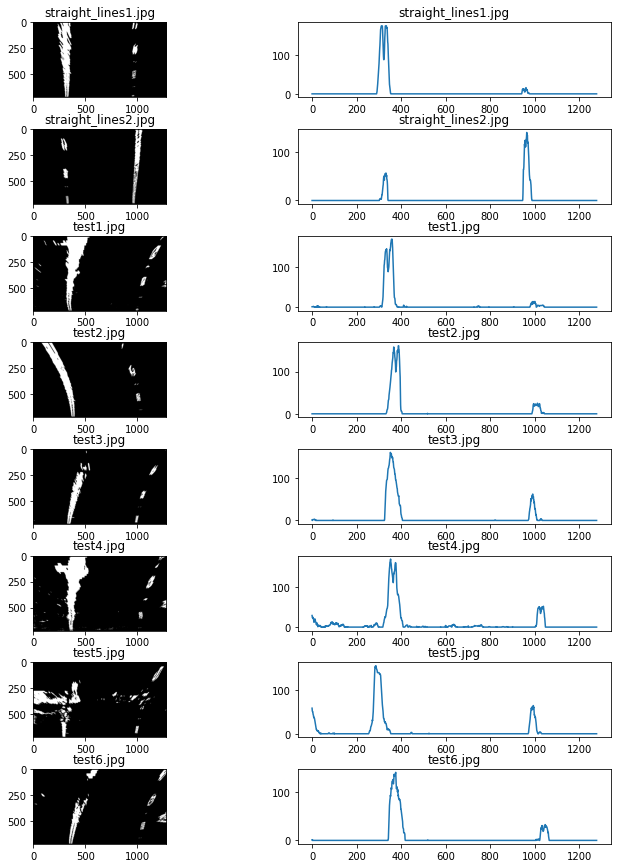

In [58]:
def calculate_histogram(binary_image):
    height, width = binary_image.shape
    bottom_half = binary_image[int(3*height/4):, :]
    return np.sum(bottom_half, axis=0)

def _plot_histograms(rgb_images, rgb_image_names):
    binary_images = [process_image(img) for img in rgb_images]
    histograms = [calculate_histogram(img) for img in binary_images]

    fig, axs = plt.subplots(len(binary_images), 2, figsize=(10, len(binary_images) * 1.5))
    fig.tight_layout()

    for i in range(len(binary_images)):
        image = binary_images[i]
        image_name = rgb_image_names[i]
        histogram = histograms[i]
        axs[i][0].imshow(image, cmap='gray') 
        axs[i][0].set_title('{}'.format(image_name))
        axs[i][1].plot(histogram) 
        axs[i][1].set_title('{}'.format(image_name))
        
_plot_histograms(LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES)

current_left_line_idx = 388
current_right_line_idx = 1013
293
293
current_left_line_idx = 481
current_right_line_idx = 1106
293
293
current_left_line_idx = 574
current_right_line_idx = 1199
293
293
current_left_line_idx = 667
current_right_line_idx = 1292
current_left_line_idx = 667
current_right_line_idx = 1292
current_left_line_idx = 667
current_right_line_idx = 1292
current_left_line_idx = 667
current_right_line_idx = 1292
current_left_line_idx = 667
current_right_line_idx = 1292
293


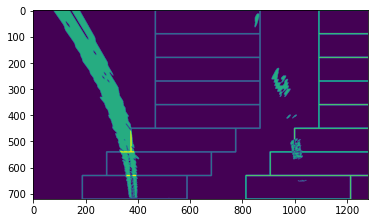

In [59]:
def find_windows(rgb_image):
    binary_image = process_image(rgb_image)
    
    # Find starting point
    height, width = binary_image.shape
    histogram = calculate_histogram(binary_image)
    mid_point = width // 2
    current_left_line_idx = np.argmax(histogram[:mid_point])
    current_right_line_idx = np.argmax(histogram[mid_point:]) + mid_point
    
    # Set hyperparameters
    num_windows = 8
    window_width= 400
    minpix = 50
    window_height = height // num_windows
    
    # Create multiple window moving upwards
    l_windows = []
    r_windows = []
    for i in range(num_windows):
        print("current_left_line_idx = {}".format(current_left_line_idx))
        print("current_right_line_idx = {}".format(current_right_line_idx))
        
        # Window position
        window_bottom_height = height - i * window_height
        window_top_height = height - (i + 1) * window_height
        
        left_window_left = current_left_line_idx - window_width // 2
        left_window_right = current_left_line_idx + window_width // 2

        right_window_left = current_right_line_idx - window_width // 2
        right_window_right = current_right_line_idx + window_width // 2

        left_window_corners = [[left_window_left, window_top_height],
                               [left_window_right, window_top_height],
                               [left_window_left, window_bottom_height],
                               [left_window_right, window_bottom_height]]

        right_window_corners = [[right_window_left, window_top_height],
                                [right_window_right, window_top_height],
                                [right_window_left, window_bottom_height],
                                [right_window_right, window_bottom_height]]
        
        left_window = binary_image[window_top_height:window_bottom_height, left_window_left:left_window_right]
        right_window = binary_image[window_top_height:window_bottom_height, right_window_left:right_window_right]
        
        def find_median_index(window):
            import statistics 
            x_indices = []
            for y in range(len(binary_image)):
                for x in range(len(binary_image[0])):
                    if binary_image[y][x] == 1:
                        x_indices.append(x)
            return int(statistics.median(x_indices))
                        
        # Do not move window if few pixels are found
        if np.sum(left_window) >= minpix:
            m = find_median_index(left_window)
            print(m)
            current_left_line_idx = m + left_window_left
        if np.sum(right_window) >= minpix:
            m = find_median_index(right_window)
            print(m)
            current_right_line_idx = m + right_window_left

        # Store window
        l_windows.append(left_window_corners)
        r_windows.append(right_window_corners)

    binary_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2RGB)

    for lw in l_windows:
        binary_image = cv2.rectangle(binary_image, (int(lw[0][0]), int(lw[0][1])), (int(lw[3][0]), int(lw[3][1])), (255, 0, 0) ,3)
    for rw in r_windows:
        binary_image = cv2.rectangle(binary_image, (int(rw[0][0]), int(rw[0][1])), (int(rw[3][0]), int(rw[3][1])), (0, 255, 0) ,3)

    orig_binary_image = process_image(rgb_image)
    plt.imshow(orig_binary_image*120 + cv2.cvtColor(binary_image, cv2.COLOR_RGB2GRAY))
    
find_windows(LANE_LINE_IMAGES[3])